In [1]:
import csv
import os
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

In [2]:
#Load Data and Create Path

health_data_to_load = Path('Resources','VSRR_Provisional_Drug_Overdose_Death_Counts.csv')

health_data = pd.read_csv(health_data_to_load)


health_data


,State,Year,Month,Period,Indicator,Data Value,Percent Complete,Percent Pending Investigation,State Name,Footnote,Footnote Symbol,Predicted Value
0,AK,2015,April,12 month-ending,"Synthetic opioids, excl. methadone (T40.4)",NaN,100,0.000000,Alaska,Numbers may differ from published reports usin...,**,NaN
1,AK,2015,April,12 month-ending,Cocaine (T40.5),NaN,100,0.000000,Alaska,Numbers may differ from published reports usin...,**,NaN
2,AK,2015,April,12 month-ending,"Opioids (T40.0-T40.4,T40.6)",NaN,100,0.000000,Alaska,Numbers may differ from published reports usin...,**,NaN
3,AK,2015,April,12 month-ending,"Natural & semi-synthetic opioids, incl. methad...",NaN,100,0.000000,Alaska,Numbers may differ from published reports usin...,**,NaN
4,AK,2015,April,12 month-ending,Number of Deaths,4133.0,100,0.000000,Alaska,Numbers may differ from published reports usin...,**,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
57595,YC,2022,September,12 month-ending,"Natural, semi-synthetic, & synthetic opioids, ...",2503.0,99.5+,0.192012,New York City,Underreported due to incomplete data.,*,2559.0
57596,YC,2022,September,12 month-ending,Number of Drug Overdose Deaths,2970.0,99.5+,0.192012,New York City,Underreported due to incomplete data.,*,3029.0
57597,YC,2022,September,12 month-ending,Natural & semi-synthetic opioids (T40.2),464.0,99.5+,0.192012,New York City,Underreported due to incomplete data.,*,475.0
57598,YC,2022,September,12 month-ending,"Synthetic opioids, excl. methadone (T40.4)",2377.0,99.5+,0.192012,New York City,Underreported due to incomplete data.,*,2431.0


In [3]:

#Read each row

health_data.to_csv('health_data.csv', index=False)

with open('health_data.csv', encoding='UTF-8') as csvfile:
    csvreader = csv.reader(csvfile, delimiter=',')
    print(csvreader)

    csv_header = next(csvreader)
    print(f"CSV Header: {csv_header}")

    for row in csvreader:
        print(row)


CSV Header: ['State', 'Year', 'Month', 'Period', 'Indicator', 'Data Value', 'Percent Complete', 'Percent Pending Investigation', 'State Name', 'Footnote', 'Footnote Symbol', 'Predicted Value']
['AK', '2015', 'April', '12 month-ending', 'Synthetic opioids, excl. methadone (T40.4)', '', '100', '0.0', 'Alaska', 'Numbers may differ from published reports using final data. See Technical Notes.  Data not shown due to low data quality.', '**', '']
['AK', '2015', 'April', '12 month-ending', 'Cocaine (T40.5)', '', '100', '0.0', 'Alaska', 'Numbers may differ from published reports using final data. See Technical Notes.  Data not shown due to low data quality.', '**', '']
['AK', '2015', 'April', '12 month-ending', 'Opioids (T40.0-T40.4,T40.6)', '', '100', '0.0', 'Alaska', 'Numbers may differ from published reports using final data. See Technical Notes.  Data not shown due to low data quality.', '**', '']
['AK', '2015', 'April', '12 month-ending', 'Natural & semi-synthetic opioids, incl. methadone

In [4]:
#Look at Columns
health_data.columns

Index(['State', 'Year', 'Month', 'Period', 'Indicator', 'Data Value',
       'Percent Complete', 'Percent Pending Investigation', 'State Name',
       'Footnote', 'Footnote Symbol', 'Predicted Value'],
      dtype='object')

In [5]:
#Check which States are included
health_data['State'].unique()

array(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA',
       'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME',
       'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM',
       'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'US', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY', 'YC'], dtype=object)

In [6]:
#Check which States are included
health_data['State Name'].unique()

array(['Alaska', 'Alabama', 'Arkansas', 'Arizona', 'California',
       'Colorado', 'Connecticut', 'District of Columbia', 'Delaware',
       'Florida', 'Georgia', 'Hawaii', 'Iowa', 'Idaho', 'Illinois',
       'Indiana', 'Kansas', 'Kentucky', 'Louisiana', 'Massachusetts',
       'Maryland', 'Maine', 'Michigan', 'Minnesota', 'Missouri',
       'Mississippi', 'Montana', 'North Carolina', 'North Dakota',
       'Nebraska', 'New Hampshire', 'New Jersey', 'New Mexico', 'Nevada',
       'New York', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'United States', 'Utah', 'Virginia', 'Vermont',
       'Washington', 'Wisconsin', 'West Virginia', 'Wyoming',
       'New York City'], dtype=object)

In [7]:
#Which drug was listed as COD
health_data['Indicator'].unique()

array(['Synthetic opioids, excl. methadone (T40.4)', 'Cocaine (T40.5)',
       'Opioids (T40.0-T40.4,T40.6)',
       'Natural & semi-synthetic opioids, incl. methadone (T40.2, T40.3)',
       'Number of Deaths', 'Heroin (T40.1)',
       'Number of Drug Overdose Deaths',
       'Natural & semi-synthetic opioids (T40.2)',
       'Psychostimulants with abuse potential (T43.6)',
       'Percent with drugs specified',
       'Natural, semi-synthetic, & synthetic opioids, incl. methadone (T40.2-T40.4)',
       'Methadone (T40.3)'], dtype=object)

In [8]:
health_data['Indicator'].value_counts()

Number of Deaths                                                               5088
Number of Drug Overdose Deaths                                                 5088
Percent with drugs specified                                                   5088
Synthetic opioids, excl. methadone (T40.4)                                     4704
Cocaine (T40.5)                                                                4704
Opioids (T40.0-T40.4,T40.6)                                                    4704
Natural & semi-synthetic opioids, incl. methadone (T40.2, T40.3)               4704
Heroin (T40.1)                                                                 4704
Natural & semi-synthetic opioids (T40.2)                                       4704
Psychostimulants with abuse potential (T43.6)                                  4704
Natural, semi-synthetic, & synthetic opioids, incl. methadone (T40.2-T40.4)    4704
Methadone (T40.3)                                                           

In [9]:
health_data['State'].value_counts()

AK    1152
SC    1152
NC    1152
NH    1152
NJ    1152
NM    1152
NV    1152
NY    1152
OH    1152
OK    1152
OR    1152
RI    1152
SD    1152
MS    1152
TN    1152
TX    1152
US    1152
UT    1152
VA    1152
VT    1152
WA    1152
WI    1152
WV    1152
WY    1152
AL    1152
MT    1152
MO    1152
ID    1152
AR    1152
AZ    1152
CA    1152
CO    1152
CT    1152
DC    1152
DE    1152
FL    1152
GA    1152
HI    1152
IA    1152
IL    1152
MN    1152
IN    1152
KS    1152
KY    1152
MA    1152
MD    1152
ME    1152
MI    1152
YC    1152
PA     288
LA     288
NE     288
ND     288
Name: State, dtype: int64

In [10]:
unique_state = health_data['State'].unique()
num_states = len(unique_state)

print(num_states)

53


In [11]:
health_data['Year'].unique()

array([2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022], dtype=int64)

In [12]:

clean_health_data = health_data.groupby(['Year', 'Indicator'])['Data Value'].sum()


clean_health_data = clean_health_data.reset_index()



#clean_health_data = clean_health_data.drop('State', axis = 1)

#clean_health_data = clean_health_data.drop('Period', axis = 1)

pd.set_option('display.float_format', lambda x: '%.0f' % x)


clean_health_data



,Year,Indicator,Data Value
0,2015,Cocaine (T40.5),108689
1,2015,Heroin (T40.1),211945
2,2015,Methadone (T40.3),59393
3,2015,Natural & semi-synthetic opioids (T40.2),223432
4,2015,"Natural & semi-synthetic opioids, incl. methad...",269613
...,...,...,...
91,2022,Number of Drug Overdose Deaths,2570618
92,2022,"Opioids (T40.0-T40.4,T40.6)",1866891
93,2022,Percent with drugs specified,61149
94,2022,Psychostimulants with abuse potential (T43.6),780471


In [13]:
#Format Column to Percent
#clean_health_data['Percent Pending Investigation'] = clean_health_data['Percent Pending Investigation']  * 100
#clean_health_data['Percent Pending Investigation'] = clean_health_data['Percent Pending Investigation'].astype(float).map("{:.2f}%".format)


#clean_health_data

In [14]:
#Created a new Data Frame for each year

k16_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2016,:])
k17_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2017,:])
k18_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2018,:])
k19_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2019,:])
k20_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2020,:])
k21_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2021,:])
k22_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2022,:])

k18_OD_Data.reset_index(drop =True)
k16_OD_Data.reset_index(drop =True)
k17_OD_Data.reset_index(drop =True)
k19_OD_Data.reset_index(drop =True)
k20_OD_Data.reset_index(drop =True)
k21_OD_Data.reset_index(drop =True)
k22_OD_Data.reset_index(drop =True)





,Year,Indicator,Data Value
0,2022,Cocaine (T40.5),601331
1,2022,Heroin (T40.1),167554
2,2022,Methadone (T40.3),78526
3,2022,Natural & semi-synthetic opioids (T40.2),289447
4,2022,"Natural & semi-synthetic opioids, incl. methad...",356157
5,2022,"Natural, semi-synthetic, & synthetic opioids, ...",1819293
6,2022,Number of Deaths,81935574
7,2022,Number of Drug Overdose Deaths,2570618
8,2022,"Opioids (T40.0-T40.4,T40.6)",1866891
9,2022,Percent with drugs specified,61149


In [25]:
k22_OD_Data .head()

,Year,Indicator,Data Value
84,2022,Cocaine (T40.5),601331
85,2022,Heroin (T40.1),167554
86,2022,Methadone (T40.3),78526
87,2022,Natural & semi-synthetic opioids (T40.2),289447
88,2022,"Natural & semi-synthetic opioids, incl. methad...",356157


In [28]:
k22_Indicator = k22_OD_Data['Indicator']
k22_Values = k22_OD_Data['Data Value']

indicators_to_remove = ['Number of Deaths', 'Number of Drug Overdose Deaths']
k22_OD_Data = k22_OD_Data[~k22_OD_Data['Indicator'].isin(indicators_to_remove)]

print(k22_OD_Data)







    Year                                          Indicator  Data Value
84  2022                                    Cocaine (T40.5)      601331
85  2022                                     Heroin (T40.1)      167554
86  2022                                  Methadone (T40.3)       78526
87  2022           Natural & semi-synthetic opioids (T40.2)      289447
88  2022  Natural & semi-synthetic opioids, incl. methad...      356157
89  2022  Natural, semi-synthetic, & synthetic opioids, ...     1819293
92  2022                        Opioids (T40.0-T40.4,T40.6)     1866891
93  2022                       Percent with drugs specified       61149
94  2022      Psychostimulants with abuse potential (T43.6)      780471
95  2022         Synthetic opioids, excl. methadone (T40.4)     1666396


In [29]:
k22_Indicator = k22_OD_Data['Indicator']
k22_Values = k22_OD_Data['Data Value']

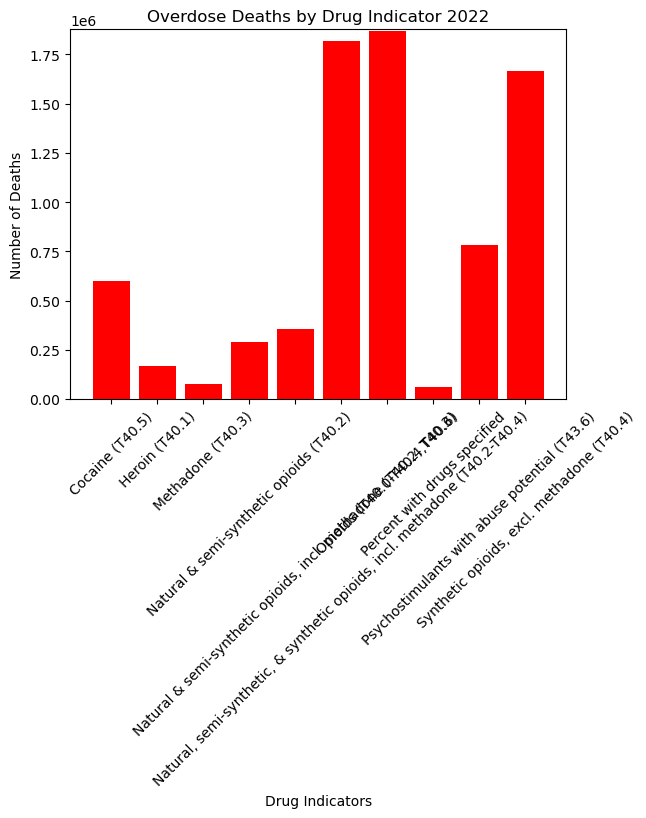

In [31]:

plt.bar(k22_Indicator, k22_Values, color = 'red')

plt.title("Overdose Deaths by Drug Indicator 2022")

plt.xlabel("Drug Indicators")

plt.ylabel("Number of Deaths")

plt.ylim(0, max(k22_Values)+10000)

plt.xticks(rotation=45)


plt.show()